# Interpretability of pain behavior recognition

## First we need dataframes for every subject

In [1]:
import sys
sys.path.append('../')

%matplotlib inline

# DEFINE GRAPH
import pandas as pd
import numpy as np
import utils

from importlib import reload
reload(utils)

pd.set_option('max_colwidth', 800) 

../data_handler.py:3: UserWarning: 
This call to matplotlib.use() has no effect because the backend has already
been chosen; matplotlib.use() must be called *before* pylab, matplotlib.pyplot,
or matplotlib.backends is imported for the first time.

The backend was *originally* set to 'module://ipykernel.pylab.backend_inline' by the following code:
  File "/Users/sbroome/miniconda2/envs/py365/lib/python3.6/runpy.py", line 193, in _run_module_as_main
    "__main__", mod_spec)
  File "/Users/sbroome/miniconda2/envs/py365/lib/python3.6/runpy.py", line 85, in _run_code
    exec(code, run_globals)
  File "/Users/sbroome/miniconda2/envs/py365/lib/python3.6/site-packages/ipykernel_launcher.py", line 16, in <module>
    app.launch_new_instance()
  File "/Users/sbroome/miniconda2/envs/py365/lib/python3.6/site-packages/traitlets/config/application.py", line 658, in launch_instance
    app.start()
  File "/Users/sbroome/miniconda2/envs/py365/lib/python3.6/site-packages/ipykernel/kernelapp.py", line

In [2]:
%%javascript
IPython.OutputArea.prototype._should_scroll = function(lines) {
    return false;
}

<IPython.core.display.Javascript object>

In [3]:
# Data paths
rgb_path = '../data/jpg_128_128_2fps/'
of_path = '../data/jpg_128_128_16fps_OF_magnitude_cv2/'

# Hyperparameters
input_width = 128
input_height = 128
seq_length = 10
seq_stride = 10
batch_size = 1
COLOR = True
nb_labels = 2

# Data augmentation
aug_flip = 0
aug_crop = 0
aug_light = 0

subject_ids = pd.read_csv('../metadata/horse_subjects.csv')['Subject'].values
channels = 3

In [4]:
from utils import ArgsProxy
args = ArgsProxy(rgb_path, of_path, input_height, input_width,
                 seq_length, seq_stride, batch_size, nb_labels,
                 aug_flip, aug_crop, aug_light)

In [5]:
import data_handler as dathand
dh = dathand.DataHandler(path=args.data_path,
                 of_path=args.of_path,
                 clip_list_file='videos_overview_missingremoved.csv',
                 data_columns=['Pain'],  # Here one can append f. ex. 'Observer'
                 image_size=(args.input_height, args.input_width),
                 seq_length=args.seq_length,
                 seq_stride=args.seq_stride,
                 batch_size=args.batch_size,
                 color=COLOR,
                 nb_labels=args.nb_labels,
                 aug_flip=args.aug_flip,
                 aug_crop=args.aug_crop,
                 aug_light=args.aug_light)

In [6]:
import utils
subject_dfs = utils.read_or_create_subject_dfs(dh, args, subject_ids)

../data/jpg_128_128_2fps/
../data/jpg_128_128_2fps/
../data/jpg_128_128_2fps/
../data/jpg_128_128_2fps/
../data/jpg_128_128_2fps/
../data/jpg_128_128_2fps/


In [7]:
subject_dfs = utils.read_or_create_subject_rgb_and_OF_dfs(dh, args, subject_ids, subject_dfs)

In [8]:
sequence_df = utils.get_sequence(args=args, subject_dfs=subject_dfs, subject=4)
y = sequence_df['Pain'].values
image_paths = sequence_df['Path'].values
of_paths = sequence_df['OF_Path'].values

Chose subject  4
Start index in subject dataframe:  3405


In [13]:
from keras.utils import np_utils
label_onehot = np_utils.to_categorical(y, num_classes=args.nb_labels)
label_onehot
batch_label = label_onehot.reshape(args.batch_size, args.seq_length, -1)

batch_img = np.concatenate(utils.read_images_and_return_list(args, image_paths, 'local'), axis=1)
batch_flow = np.concatenate(utils.read_images_and_return_list(args, of_paths, 'local'), axis=1)

## Now that we have frames from all subjects, we can import gradcam functionality

In [9]:
# Choose a model to work on
two_stream = True

best_model_path = '../models/BEST_MODEL_2stream_5d_add_adadelta_LSTMunits_32_CONVfilters_16_add_v4_t2_4hl_128jpg2fps_seq10_bs8_MAG_adadelta_noaug_run1_rerun_for_gradcam.h5'
import keras
m = keras.models.load_model(best_model_path)

In [10]:
from keras import backend as K
import tensorflow as tf
    
images = tf.placeholder(tf.float32, [batch_size, args.seq_length, args.input_width, args.input_height, channels])
flows = tf.placeholder(tf.float32, [batch_size, args.seq_length, args.input_width, args.input_height, channels])
labels = tf.placeholder(tf.float32, [batch_size, args.seq_length, 2])

if two_stream:
    clstm_model = utils.TwoStreamCLSTMNetwork(images, flows, from_scratch=0, path=best_model_path)
else:
    clstm_model = utils.CLSTMNetwork(images, from_scratch=0, path=best_model_path)

sess = K.get_session()  # Grab the Keras session where the weights are initialized.

cost = (-1) * tf.reduce_sum(tf.multiply(labels, tf.log(clstm_model.preds)), axis=1)
    
y_c = tf.reduce_sum(tf.multiply(clstm_model.dense, labels), axis=1)

print('model preds: ', clstm_model.preds)
print('cost: ', cost)
print('y_c: ', y_c)


    
if two_stream:
    target_conv_layer = clstm_model.clstm4_rgb # Choose which CLSTM-layer to study
    # target_conv_layer = clstm_model.clstm1_rgb # Choose which CLSTM-layer to study
    # target_conv_layer = clstm_model.merge # Choose which CLSTM-layer to study
else:
    target_conv_layer = clstm_model.clstm4 # Choose which CLSTM-layer to study
    
print('tcl: ', target_conv_layer)
print('TYPE tcl: ', type(target_conv_layer))
    
target_conv_layer_grad = tf.gradients(y_c, target_conv_layer)[0]

print('tclg: ', target_conv_layer_grad)
    
gb_grad = tf.gradients(cost, [images, flows])[0]  # Guided backpropagation back to input layer

model preds:  Tensor("activation_1_2/Sigmoid:0", shape=(1, 10, 2), dtype=float32)
cost:  Tensor("mul_1:0", shape=(1, 2), dtype=float32)
y_c:  Tensor("Sum_1:0", shape=(1, 2), dtype=float32)
tcl:  Tensor("conv_lst_m2d_4_2/transpose_1:0", shape=(1, ?, 16, 16, 32), dtype=float32)
TYPE tcl:  <class 'tensorflow.python.framework.ops.Tensor'>
tclg:  Tensor("gradients/time_distributed_4_2/transpose_grad/transpose:0", shape=(1, ?, 16, 16, 32), dtype=float32)


In [11]:
def run_on_one_sequence(sess, clstm_model, batch_img, batch_flow, two_stream=True):
    with sess.as_default():

        # 2-stream
        if two_stream:
            prob = sess.run(clstm_model.preds,
                            feed_dict={images: batch_img,
                                       flows: batch_flow,
                                       K.learning_phase(): 0})

            print(prob)

            gb_grad_value, target_conv_layer_value, target_conv_layer_grad_value =                 sess.run([gb_grad, target_conv_layer, target_conv_layer_grad],
                          feed_dict={images: batch_img,
                                     flows: batch_flow,
                                     labels: batch_label,
                                     K.learning_phase(): 0})

            target_conv_layer_value = np.reshape(target_conv_layer_value,
                                             (1, 10, 16, 16, 32))
            target_conv_layer_grad_value = np.reshape(target_conv_layer_grad_value,
                                             (1, 10, 16, 16, 32))
            
        else:
            prob = sess.run(clstm_model.preds,
                            feed_dict={images: batch_img,
                                       K.learning_phase(): 0})

            print(prob)
            gb_grad_value, target_conv_layer_value, target_conv_layer_grad_value =                 sess.run([gb_grad, target_conv_layer, target_conv_layer_grad],
                          feed_dict={images: batch_img,
                          labels: batch_label,
                          K.learning_phase(): 0})
            target_conv_layer_value = np.reshape(target_conv_layer_value,
                                         (1, 10, 16, 16, 32))
            target_conv_layer_grad_value = np.reshape(target_conv_layer_grad_value,
                                         (1, 10, 16, 16, 32))


        utils.visualize_overlays(batch_img, target_conv_layer_value,
                           target_conv_layer_grad_value, batch_flow)


# Two-stream predictions for subject t2

Chose subject  2
Start index in subject dataframe:  9690
                                                  Path  Pain
0  data/jpg_128_128_2fps/horse_3/3_4a/frame_000147.jpg     1
1  data/jpg_128_128_2fps/horse_3/3_4a/frame_000148.jpg     1
2  data/jpg_128_128_2fps/horse_3/3_4a/frame_000149.jpg     1
3  data/jpg_128_128_2fps/horse_3/3_4a/frame_000150.jpg     1
4  data/jpg_128_128_2fps/horse_3/3_4a/frame_000151.jpg     1
5  data/jpg_128_128_2fps/horse_3/3_4a/frame_000152.jpg     1
6  data/jpg_128_128_2fps/horse_3/3_4a/frame_000153.jpg     1
7  data/jpg_128_128_2fps/horse_3/3_4a/frame_000154.jpg     1
8  data/jpg_128_128_2fps/horse_3/3_4a/frame_000155.jpg     1
9  data/jpg_128_128_2fps/horse_3/3_4a/frame_000156.jpg     1
[[[0.53581727 0.42722008]
  [0.33173648 0.6087792 ]
  [0.08431663 0.82247204]
  [0.02433668 0.9221171 ]
  [0.01091155 0.96135896]
  [0.00769884 0.97175175]
  [0.00667238 0.9793132 ]
  [0.01043739 0.98056155]
  [0.01276991 0.97804385]
  [0.01267908 0.98201925]]]


/Users/sbroome/miniconda2/envs/py365/lib/python3.6/site-packages/skimage/transform/_warps.py:105: UserWarning: The default mode, 'constant', will be changed to 'reflect' in skimage 0.15.
  warn("The default mode, 'constant', will be changed to 'reflect' in "
/Users/sbroome/miniconda2/envs/py365/lib/python3.6/site-packages/skimage/transform/_warps.py:110: UserWarning: Anti-aliasing will be enabled by default in skimage 0.15 to avoid aliasing artifacts when down-sampling images.
  warn("Anti-aliasing will be enabled by default in skimage 0.15 to "
/Users/sbroome/miniconda2/envs/py365/lib/python3.6/site-packages/matplotlib/cbook/deprecation.py:107: MatplotlibDeprecationWarning: Passing one of 'on', 'true', 'off', 'false' as a boolean is deprecated; use an actual boolean (True/False) instead.
  warnings.warn(message, mplDeprecation, stacklevel=1)


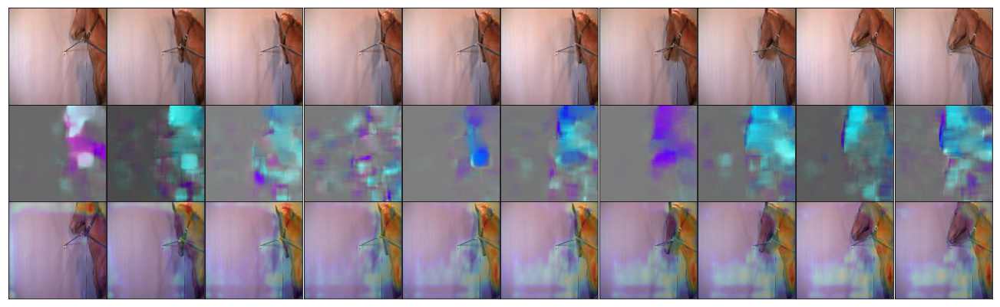

In [12]:
batch_img, batch_flow, batch_label = utils.data_for_one_random_sequence_two_stream(args, subject_dfs, computer='local', subject=2)
run_on_one_sequence(sess, clstm_model, batch_img, batch_flow, two_stream=True);

Chose subject  2
Start index in subject dataframe:  4045
                                                  Path  Pain
0  data/jpg_128_128_2fps/horse_3/3_1c/frame_000404.jpg     0
1  data/jpg_128_128_2fps/horse_3/3_1c/frame_000405.jpg     0
2  data/jpg_128_128_2fps/horse_3/3_1c/frame_000406.jpg     0
3  data/jpg_128_128_2fps/horse_3/3_1c/frame_000407.jpg     0
4  data/jpg_128_128_2fps/horse_3/3_1c/frame_000408.jpg     0
5  data/jpg_128_128_2fps/horse_3/3_1c/frame_000409.jpg     0
6  data/jpg_128_128_2fps/horse_3/3_1c/frame_000410.jpg     0
7  data/jpg_128_128_2fps/horse_3/3_1c/frame_000411.jpg     0
8  data/jpg_128_128_2fps/horse_3/3_1c/frame_000412.jpg     0
9  data/jpg_128_128_2fps/horse_3/3_1c/frame_000413.jpg     0
[[[0.73115283 0.35826325]
  [0.81453544 0.31519958]
  [0.85026187 0.3518005 ]
  [0.92601115 0.25330955]
  [0.95014244 0.14783546]
  [0.9577041  0.08433566]
  [0.96430135 0.06297037]
  [0.96501386 0.04858117]
  [0.96234167 0.04030268]
  [0.97506535 0.03394844]]]


/Users/sbroome/miniconda2/envs/py365/lib/python3.6/site-packages/skimage/transform/_warps.py:105: UserWarning: The default mode, 'constant', will be changed to 'reflect' in skimage 0.15.
  warn("The default mode, 'constant', will be changed to 'reflect' in "
/Users/sbroome/miniconda2/envs/py365/lib/python3.6/site-packages/skimage/transform/_warps.py:110: UserWarning: Anti-aliasing will be enabled by default in skimage 0.15 to avoid aliasing artifacts when down-sampling images.
  warn("Anti-aliasing will be enabled by default in skimage 0.15 to "
/Users/sbroome/miniconda2/envs/py365/lib/python3.6/site-packages/matplotlib/cbook/deprecation.py:107: MatplotlibDeprecationWarning: Passing one of 'on', 'true', 'off', 'false' as a boolean is deprecated; use an actual boolean (True/False) instead.
  warnings.warn(message, mplDeprecation, stacklevel=1)


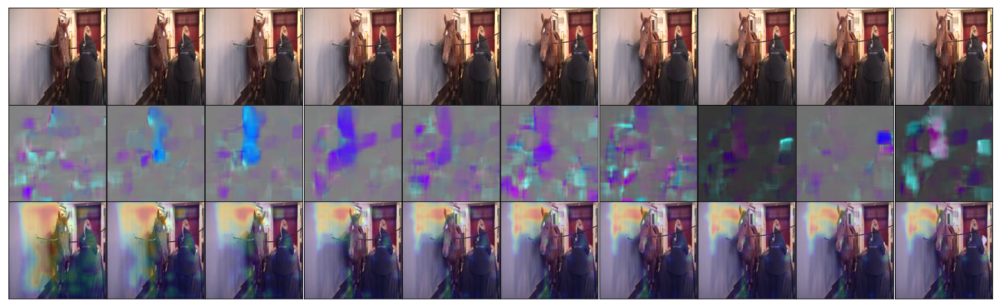

In [13]:
batch_img, batch_flow, batch_label = utils.data_for_one_random_sequence_two_stream(args, subject_dfs, computer='local', subject=2)
run_on_one_sequence(sess, clstm_model, batch_img, batch_flow, two_stream=True);

Chose subject  2
Start index in subject dataframe:  8371
                                                  Path  Pain
0  data/jpg_128_128_2fps/horse_3/3_3a/frame_001032.jpg     1
1  data/jpg_128_128_2fps/horse_3/3_3a/frame_001033.jpg     1
2  data/jpg_128_128_2fps/horse_3/3_3a/frame_001034.jpg     1
3  data/jpg_128_128_2fps/horse_3/3_3a/frame_001035.jpg     1
4  data/jpg_128_128_2fps/horse_3/3_3a/frame_001036.jpg     1
5  data/jpg_128_128_2fps/horse_3/3_3a/frame_001037.jpg     1
6  data/jpg_128_128_2fps/horse_3/3_3a/frame_001038.jpg     1
7  data/jpg_128_128_2fps/horse_3/3_3a/frame_001039.jpg     1
8  data/jpg_128_128_2fps/horse_3/3_3a/frame_001040.jpg     1
9  data/jpg_128_128_2fps/horse_3/3_3a/frame_001041.jpg     1
[[[0.67151344 0.5044023 ]
  [0.6171387  0.59023535]
  [0.39654788 0.64133567]
  [0.21284306 0.6660608 ]
  [0.17171523 0.71129066]
  [0.19002135 0.7018454 ]
  [0.24157728 0.74535596]
  [0.26342365 0.80052304]
  [0.31380385 0.8185053 ]
  [0.30566514 0.8678593 ]]]


/Users/sbroome/miniconda2/envs/py365/lib/python3.6/site-packages/skimage/transform/_warps.py:105: UserWarning: The default mode, 'constant', will be changed to 'reflect' in skimage 0.15.
  warn("The default mode, 'constant', will be changed to 'reflect' in "
/Users/sbroome/miniconda2/envs/py365/lib/python3.6/site-packages/skimage/transform/_warps.py:110: UserWarning: Anti-aliasing will be enabled by default in skimage 0.15 to avoid aliasing artifacts when down-sampling images.
  warn("Anti-aliasing will be enabled by default in skimage 0.15 to "
/Users/sbroome/miniconda2/envs/py365/lib/python3.6/site-packages/matplotlib/cbook/deprecation.py:107: MatplotlibDeprecationWarning: Passing one of 'on', 'true', 'off', 'false' as a boolean is deprecated; use an actual boolean (True/False) instead.
  warnings.warn(message, mplDeprecation, stacklevel=1)


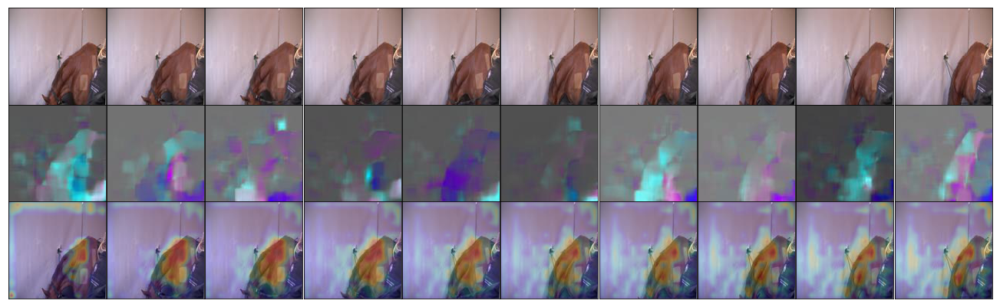

In [14]:
batch_img, batch_flow, batch_label = utils.data_for_one_random_sequence_two_stream(args, subject_dfs, computer='local', subject=2)
run_on_one_sequence(sess, clstm_model, batch_img, batch_flow, two_stream=True);

Chose subject  2
Start index in subject dataframe:  2063
                                                  Path  Pain
0  data/jpg_128_128_2fps/horse_3/3_1b/frame_000046.jpg     0
1  data/jpg_128_128_2fps/horse_3/3_1b/frame_000047.jpg     0
2  data/jpg_128_128_2fps/horse_3/3_1b/frame_000048.jpg     0
3  data/jpg_128_128_2fps/horse_3/3_1b/frame_000049.jpg     0
4  data/jpg_128_128_2fps/horse_3/3_1b/frame_000050.jpg     0
5  data/jpg_128_128_2fps/horse_3/3_1b/frame_000051.jpg     0
6  data/jpg_128_128_2fps/horse_3/3_1b/frame_000052.jpg     0
7  data/jpg_128_128_2fps/horse_3/3_1b/frame_000053.jpg     0
8  data/jpg_128_128_2fps/horse_3/3_1b/frame_000054.jpg     0
9  data/jpg_128_128_2fps/horse_3/3_1b/frame_000055.jpg     0
[[[0.50268894 0.413669  ]
  [0.3045663  0.31334782]
  [0.1366165  0.37556058]
  [0.06214505 0.3314824 ]
  [0.03249357 0.32520315]
  [0.02159019 0.36434656]
  [0.02276397 0.4817814 ]
  [0.02827627 0.50477356]
  [0.04352627 0.59039915]
  [0.09502015 0.6814908 ]]]


/Users/sbroome/miniconda2/envs/py365/lib/python3.6/site-packages/skimage/transform/_warps.py:105: UserWarning: The default mode, 'constant', will be changed to 'reflect' in skimage 0.15.
  warn("The default mode, 'constant', will be changed to 'reflect' in "
/Users/sbroome/miniconda2/envs/py365/lib/python3.6/site-packages/skimage/transform/_warps.py:110: UserWarning: Anti-aliasing will be enabled by default in skimage 0.15 to avoid aliasing artifacts when down-sampling images.
  warn("Anti-aliasing will be enabled by default in skimage 0.15 to "
/Users/sbroome/miniconda2/envs/py365/lib/python3.6/site-packages/matplotlib/cbook/deprecation.py:107: MatplotlibDeprecationWarning: Passing one of 'on', 'true', 'off', 'false' as a boolean is deprecated; use an actual boolean (True/False) instead.
  warnings.warn(message, mplDeprecation, stacklevel=1)


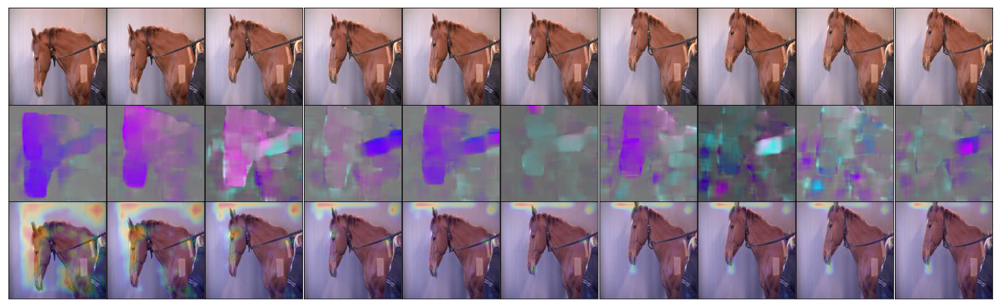

In [15]:
batch_img, batch_flow, batch_label = utils.data_for_one_random_sequence_two_stream(args, subject_dfs, computer='local', subject=2)
run_on_one_sequence(sess, clstm_model, batch_img, batch_flow, two_stream=True);

Chose subject  2
Start index in subject dataframe:  7652
                                                  Path  Pain
0  data/jpg_128_128_2fps/horse_3/3_3a/frame_000313.jpg     1
1  data/jpg_128_128_2fps/horse_3/3_3a/frame_000314.jpg     1
2  data/jpg_128_128_2fps/horse_3/3_3a/frame_000315.jpg     1
3  data/jpg_128_128_2fps/horse_3/3_3a/frame_000316.jpg     1
4  data/jpg_128_128_2fps/horse_3/3_3a/frame_000317.jpg     1
5  data/jpg_128_128_2fps/horse_3/3_3a/frame_000318.jpg     1
6  data/jpg_128_128_2fps/horse_3/3_3a/frame_000319.jpg     1
7  data/jpg_128_128_2fps/horse_3/3_3a/frame_000320.jpg     1
8  data/jpg_128_128_2fps/horse_3/3_3a/frame_000321.jpg     1
9  data/jpg_128_128_2fps/horse_3/3_3a/frame_000322.jpg     1
[[[0.6605827  0.47853383]
  [0.6729188  0.6152932 ]
  [0.52914655 0.6879368 ]
  [0.42226052 0.73334634]
  [0.42702988 0.74396336]
  [0.4082495  0.68098706]
  [0.26721767 0.6148506 ]
  [0.17009443 0.6164999 ]
  [0.09660735 0.65576434]
  [0.09795308 0.6905729 ]]]


/Users/sbroome/miniconda2/envs/py365/lib/python3.6/site-packages/skimage/transform/_warps.py:105: UserWarning: The default mode, 'constant', will be changed to 'reflect' in skimage 0.15.
  warn("The default mode, 'constant', will be changed to 'reflect' in "
/Users/sbroome/miniconda2/envs/py365/lib/python3.6/site-packages/skimage/transform/_warps.py:110: UserWarning: Anti-aliasing will be enabled by default in skimage 0.15 to avoid aliasing artifacts when down-sampling images.
  warn("Anti-aliasing will be enabled by default in skimage 0.15 to "
/Users/sbroome/miniconda2/envs/py365/lib/python3.6/site-packages/matplotlib/cbook/deprecation.py:107: MatplotlibDeprecationWarning: Passing one of 'on', 'true', 'off', 'false' as a boolean is deprecated; use an actual boolean (True/False) instead.
  warnings.warn(message, mplDeprecation, stacklevel=1)


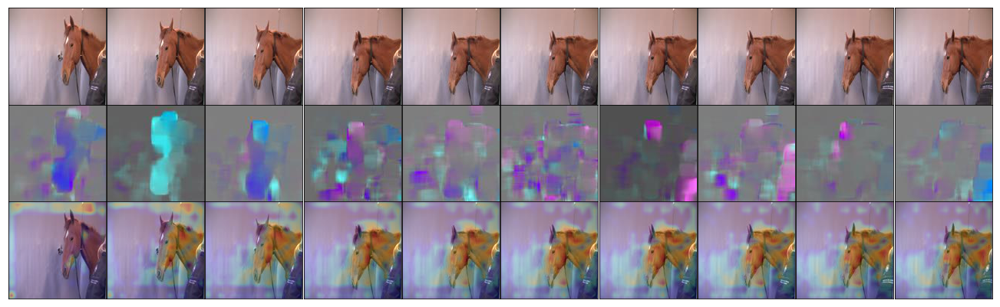

In [16]:
batch_img, batch_flow, batch_label = utils.data_for_one_random_sequence_two_stream(args, subject_dfs, computer='local', subject=2)
run_on_one_sequence(sess, clstm_model, batch_img, batch_flow, two_stream=True);

Chose subject  2
Start index in subject dataframe:  1370
                                                  Path  Pain
0  data/jpg_128_128_2fps/horse_3/3_1a/frame_001371.jpg     0
1  data/jpg_128_128_2fps/horse_3/3_1a/frame_001372.jpg     0
2  data/jpg_128_128_2fps/horse_3/3_1a/frame_001373.jpg     0
3  data/jpg_128_128_2fps/horse_3/3_1a/frame_001374.jpg     0
4  data/jpg_128_128_2fps/horse_3/3_1a/frame_001375.jpg     0
5  data/jpg_128_128_2fps/horse_3/3_1a/frame_001376.jpg     0
6  data/jpg_128_128_2fps/horse_3/3_1a/frame_001377.jpg     0
7  data/jpg_128_128_2fps/horse_3/3_1a/frame_001378.jpg     0
8  data/jpg_128_128_2fps/horse_3/3_1a/frame_001379.jpg     0
9  data/jpg_128_128_2fps/horse_3/3_1a/frame_001380.jpg     0
[[[0.65295494 0.54276544]
  [0.56973267 0.7280371 ]
  [0.37548986 0.87102515]
  [0.15537226 0.93938833]
  [0.05912023 0.9435306 ]
  [0.04349929 0.92680025]
  [0.05575591 0.9279207 ]
  [0.08548639 0.92989004]
  [0.17821316 0.9291384 ]
  [0.21315387 0.955483  ]]]


/Users/sbroome/miniconda2/envs/py365/lib/python3.6/site-packages/skimage/transform/_warps.py:105: UserWarning: The default mode, 'constant', will be changed to 'reflect' in skimage 0.15.
  warn("The default mode, 'constant', will be changed to 'reflect' in "
/Users/sbroome/miniconda2/envs/py365/lib/python3.6/site-packages/skimage/transform/_warps.py:110: UserWarning: Anti-aliasing will be enabled by default in skimage 0.15 to avoid aliasing artifacts when down-sampling images.
  warn("Anti-aliasing will be enabled by default in skimage 0.15 to "
/Users/sbroome/miniconda2/envs/py365/lib/python3.6/site-packages/matplotlib/cbook/deprecation.py:107: MatplotlibDeprecationWarning: Passing one of 'on', 'true', 'off', 'false' as a boolean is deprecated; use an actual boolean (True/False) instead.
  warnings.warn(message, mplDeprecation, stacklevel=1)


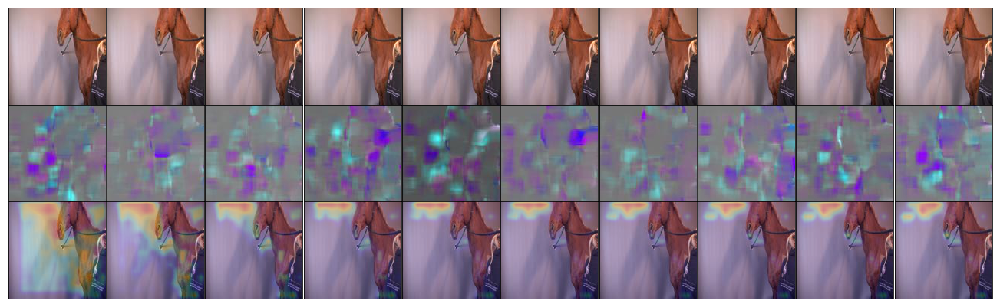

In [17]:
batch_img, batch_flow, batch_label = utils.data_for_one_random_sequence_two_stream(args, subject_dfs, computer='local', subject=2)
run_on_one_sequence(sess, clstm_model, batch_img, batch_flow, two_stream=True);

Chose subject  2
Start index in subject dataframe:  3920
                                                  Path  Pain
0  data/jpg_128_128_2fps/horse_3/3_1c/frame_000279.jpg     0
1  data/jpg_128_128_2fps/horse_3/3_1c/frame_000280.jpg     0
2  data/jpg_128_128_2fps/horse_3/3_1c/frame_000281.jpg     0
3  data/jpg_128_128_2fps/horse_3/3_1c/frame_000282.jpg     0
4  data/jpg_128_128_2fps/horse_3/3_1c/frame_000283.jpg     0
5  data/jpg_128_128_2fps/horse_3/3_1c/frame_000284.jpg     0
6  data/jpg_128_128_2fps/horse_3/3_1c/frame_000285.jpg     0
7  data/jpg_128_128_2fps/horse_3/3_1c/frame_000286.jpg     0
8  data/jpg_128_128_2fps/horse_3/3_1c/frame_000287.jpg     0
9  data/jpg_128_128_2fps/horse_3/3_1c/frame_000288.jpg     0
[[[0.6342869  0.36584508]
  [0.67858577 0.2403372 ]
  [0.70318455 0.1563815 ]
  [0.7701218  0.0910421 ]
  [0.8859096  0.08060902]
  [0.9305814  0.09760426]
  [0.9521956  0.108822  ]
  [0.95991886 0.11377908]
  [0.9698342  0.15506442]
  [0.96671975 0.22647461]]]


/Users/sbroome/miniconda2/envs/py365/lib/python3.6/site-packages/skimage/transform/_warps.py:105: UserWarning: The default mode, 'constant', will be changed to 'reflect' in skimage 0.15.
  warn("The default mode, 'constant', will be changed to 'reflect' in "
/Users/sbroome/miniconda2/envs/py365/lib/python3.6/site-packages/skimage/transform/_warps.py:110: UserWarning: Anti-aliasing will be enabled by default in skimage 0.15 to avoid aliasing artifacts when down-sampling images.
  warn("Anti-aliasing will be enabled by default in skimage 0.15 to "
/Users/sbroome/miniconda2/envs/py365/lib/python3.6/site-packages/matplotlib/cbook/deprecation.py:107: MatplotlibDeprecationWarning: Passing one of 'on', 'true', 'off', 'false' as a boolean is deprecated; use an actual boolean (True/False) instead.
  warnings.warn(message, mplDeprecation, stacklevel=1)


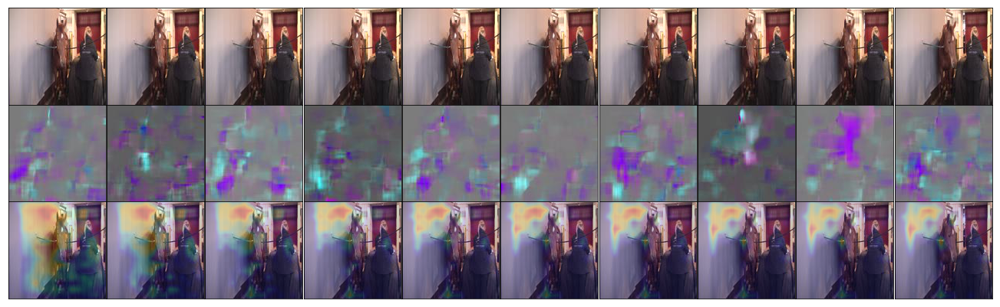

In [21]:
batch_img, batch_flow, batch_label = utils.data_for_one_random_sequence_two_stream(args, subject_dfs, computer='local', subject=2)
run_on_one_sequence(sess, clstm_model, batch_img, batch_flow, two_stream=True);

Chose subject  2
Start index in subject dataframe:  1767
                                                  Path  Pain
0  data/jpg_128_128_2fps/horse_3/3_1a/frame_001768.jpg     0
1  data/jpg_128_128_2fps/horse_3/3_1a/frame_001769.jpg     0
2  data/jpg_128_128_2fps/horse_3/3_1a/frame_001770.jpg     0
3  data/jpg_128_128_2fps/horse_3/3_1a/frame_001771.jpg     0
4  data/jpg_128_128_2fps/horse_3/3_1a/frame_001772.jpg     0
5  data/jpg_128_128_2fps/horse_3/3_1a/frame_001773.jpg     0
6  data/jpg_128_128_2fps/horse_3/3_1a/frame_001774.jpg     0
7  data/jpg_128_128_2fps/horse_3/3_1a/frame_001775.jpg     0
8  data/jpg_128_128_2fps/horse_3/3_1a/frame_001776.jpg     0
9  data/jpg_128_128_2fps/horse_3/3_1a/frame_001777.jpg     0
[[[0.65466833 0.37359032]
  [0.63873696 0.25230354]
  [0.47286314 0.16405201]
  [0.35209498 0.12317111]
  [0.25009102 0.10309129]
  [0.13794413 0.09898619]
  [0.12069698 0.09869841]
  [0.15437227 0.09101646]
  [0.16115613 0.11049161]
  [0.15741545 0.12434167]]]


/Users/sbroome/miniconda2/envs/py365/lib/python3.6/site-packages/skimage/transform/_warps.py:105: UserWarning: The default mode, 'constant', will be changed to 'reflect' in skimage 0.15.
  warn("The default mode, 'constant', will be changed to 'reflect' in "
/Users/sbroome/miniconda2/envs/py365/lib/python3.6/site-packages/skimage/transform/_warps.py:110: UserWarning: Anti-aliasing will be enabled by default in skimage 0.15 to avoid aliasing artifacts when down-sampling images.
  warn("Anti-aliasing will be enabled by default in skimage 0.15 to "
/Users/sbroome/miniconda2/envs/py365/lib/python3.6/site-packages/matplotlib/cbook/deprecation.py:107: MatplotlibDeprecationWarning: Passing one of 'on', 'true', 'off', 'false' as a boolean is deprecated; use an actual boolean (True/False) instead.
  warnings.warn(message, mplDeprecation, stacklevel=1)


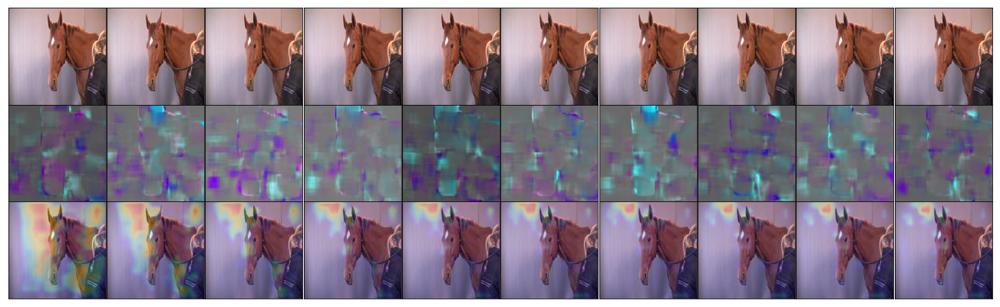

In [22]:
batch_img, batch_flow, batch_label = utils.data_for_one_random_sequence_two_stream(args, subject_dfs, computer='local', subject=2)
run_on_one_sequence(sess, clstm_model, batch_img, batch_flow, two_stream=True);

Chose subject  2
Start index in subject dataframe:  7044
                                                  Path  Pain
0  data/jpg_128_128_2fps/horse_3/3_1d/frame_001415.jpg     0
1  data/jpg_128_128_2fps/horse_3/3_1d/frame_001416.jpg     0
2  data/jpg_128_128_2fps/horse_3/3_1d/frame_001417.jpg     0
3  data/jpg_128_128_2fps/horse_3/3_1d/frame_001418.jpg     0
4  data/jpg_128_128_2fps/horse_3/3_1d/frame_001419.jpg     0
5  data/jpg_128_128_2fps/horse_3/3_1d/frame_001420.jpg     0
6  data/jpg_128_128_2fps/horse_3/3_1d/frame_001421.jpg     0
7  data/jpg_128_128_2fps/horse_3/3_1d/frame_001422.jpg     0
8  data/jpg_128_128_2fps/horse_3/3_1d/frame_001423.jpg     0
9  data/jpg_128_128_2fps/horse_3/3_1d/frame_001424.jpg     0
[[[0.67085004 0.3726174 ]
  [0.76343197 0.30643812]
  [0.72712547 0.28650057]
  [0.78830624 0.35771552]
  [0.9203172  0.42304885]
  [0.9662645  0.45352495]
  [0.9778502  0.4019432 ]
  [0.98454225 0.43795142]
  [0.9882665  0.38755715]
  [0.99033326 0.26014432]]]


/Users/sbroome/miniconda2/envs/py365/lib/python3.6/site-packages/skimage/transform/_warps.py:105: UserWarning: The default mode, 'constant', will be changed to 'reflect' in skimage 0.15.
  warn("The default mode, 'constant', will be changed to 'reflect' in "
/Users/sbroome/miniconda2/envs/py365/lib/python3.6/site-packages/skimage/transform/_warps.py:110: UserWarning: Anti-aliasing will be enabled by default in skimage 0.15 to avoid aliasing artifacts when down-sampling images.
  warn("Anti-aliasing will be enabled by default in skimage 0.15 to "
/Users/sbroome/miniconda2/envs/py365/lib/python3.6/site-packages/matplotlib/cbook/deprecation.py:107: MatplotlibDeprecationWarning: Passing one of 'on', 'true', 'off', 'false' as a boolean is deprecated; use an actual boolean (True/False) instead.
  warnings.warn(message, mplDeprecation, stacklevel=1)


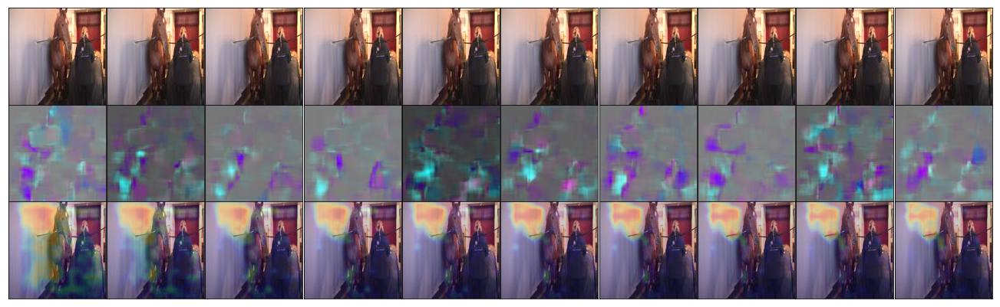

In [23]:
batch_img, batch_flow, batch_label = utils.data_for_one_random_sequence_two_stream(args, subject_dfs, computer='local', subject=2)
run_on_one_sequence(sess, clstm_model, batch_img, batch_flow, two_stream=True);

Chose subject  2
Start index in subject dataframe:  565
                                                  Path  Pain
0  data/jpg_128_128_2fps/horse_3/3_1a/frame_000566.jpg     0
1  data/jpg_128_128_2fps/horse_3/3_1a/frame_000567.jpg     0
2  data/jpg_128_128_2fps/horse_3/3_1a/frame_000568.jpg     0
3  data/jpg_128_128_2fps/horse_3/3_1a/frame_000569.jpg     0
4  data/jpg_128_128_2fps/horse_3/3_1a/frame_000570.jpg     0
5  data/jpg_128_128_2fps/horse_3/3_1a/frame_000571.jpg     0
6  data/jpg_128_128_2fps/horse_3/3_1a/frame_000572.jpg     0
7  data/jpg_128_128_2fps/horse_3/3_1a/frame_000573.jpg     0
8  data/jpg_128_128_2fps/horse_3/3_1a/frame_000574.jpg     0
9  data/jpg_128_128_2fps/horse_3/3_1a/frame_000575.jpg     0
[[[0.62603366 0.45937952]
  [0.59923035 0.49017477]
  [0.5172787  0.6317439 ]
  [0.5262674  0.60689366]
  [0.5857185  0.6614938 ]
  [0.5639392  0.68355376]
  [0.5591767  0.74467015]
  [0.48240006 0.70033646]
  [0.4372274  0.5930636 ]
  [0.4880698  0.50672984]]]


/Users/sbroome/miniconda2/envs/py365/lib/python3.6/site-packages/skimage/transform/_warps.py:105: UserWarning: The default mode, 'constant', will be changed to 'reflect' in skimage 0.15.
  warn("The default mode, 'constant', will be changed to 'reflect' in "
/Users/sbroome/miniconda2/envs/py365/lib/python3.6/site-packages/skimage/transform/_warps.py:110: UserWarning: Anti-aliasing will be enabled by default in skimage 0.15 to avoid aliasing artifacts when down-sampling images.
  warn("Anti-aliasing will be enabled by default in skimage 0.15 to "
/Users/sbroome/miniconda2/envs/py365/lib/python3.6/site-packages/matplotlib/cbook/deprecation.py:107: MatplotlibDeprecationWarning: Passing one of 'on', 'true', 'off', 'false' as a boolean is deprecated; use an actual boolean (True/False) instead.
  warnings.warn(message, mplDeprecation, stacklevel=1)


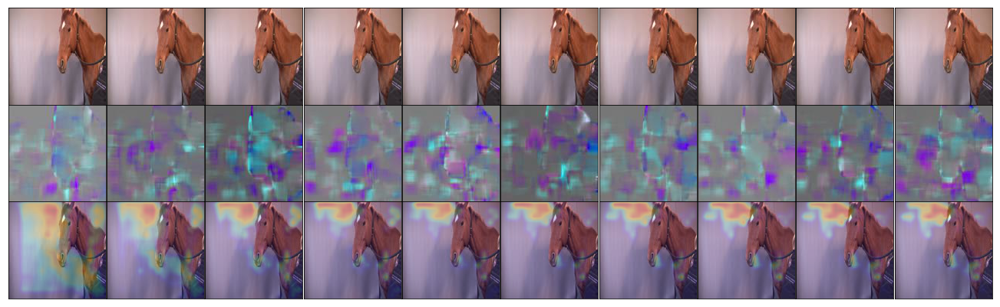

In [24]:
batch_img, batch_flow, batch_label = utils.data_for_one_random_sequence_two_stream(args, subject_dfs, computer='local', subject=2)
run_on_one_sequence(sess, clstm_model, batch_img, batch_flow, two_stream=True);

Chose subject  2
Start index in subject dataframe:  132
                                                  Path  Pain
0  data/jpg_128_128_2fps/horse_3/3_1a/frame_000133.jpg     0
1  data/jpg_128_128_2fps/horse_3/3_1a/frame_000134.jpg     0
2  data/jpg_128_128_2fps/horse_3/3_1a/frame_000135.jpg     0
3  data/jpg_128_128_2fps/horse_3/3_1a/frame_000136.jpg     0
4  data/jpg_128_128_2fps/horse_3/3_1a/frame_000137.jpg     0
5  data/jpg_128_128_2fps/horse_3/3_1a/frame_000138.jpg     0
6  data/jpg_128_128_2fps/horse_3/3_1a/frame_000139.jpg     0
7  data/jpg_128_128_2fps/horse_3/3_1a/frame_000140.jpg     0
8  data/jpg_128_128_2fps/horse_3/3_1a/frame_000141.jpg     0
9  data/jpg_128_128_2fps/horse_3/3_1a/frame_000142.jpg     0
[[[0.60149425 0.42902586]
  [0.5435098  0.42267928]
  [0.38442543 0.46835515]
  [0.389126   0.5576312 ]
  [0.3282442  0.5044412 ]
  [0.39148697 0.5223941 ]
  [0.49352986 0.5301765 ]
  [0.562504   0.57158035]
  [0.6888696  0.5814423 ]
  [0.79662895 0.5861999 ]]]


/Users/sbroome/miniconda2/envs/py365/lib/python3.6/site-packages/skimage/transform/_warps.py:105: UserWarning: The default mode, 'constant', will be changed to 'reflect' in skimage 0.15.
  warn("The default mode, 'constant', will be changed to 'reflect' in "
/Users/sbroome/miniconda2/envs/py365/lib/python3.6/site-packages/skimage/transform/_warps.py:110: UserWarning: Anti-aliasing will be enabled by default in skimage 0.15 to avoid aliasing artifacts when down-sampling images.
  warn("Anti-aliasing will be enabled by default in skimage 0.15 to "
/Users/sbroome/miniconda2/envs/py365/lib/python3.6/site-packages/matplotlib/cbook/deprecation.py:107: MatplotlibDeprecationWarning: Passing one of 'on', 'true', 'off', 'false' as a boolean is deprecated; use an actual boolean (True/False) instead.
  warnings.warn(message, mplDeprecation, stacklevel=1)


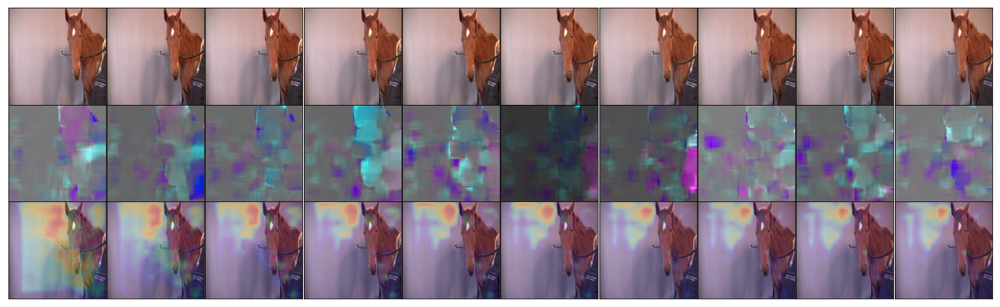

In [25]:
batch_img, batch_flow, batch_label = utils.data_for_one_random_sequence_two_stream(args, subject_dfs, computer='local', subject=2)
run_on_one_sequence(sess, clstm_model, batch_img, batch_flow, two_stream=True);

Chose subject  2
Start index in subject dataframe:  4921
                                                  Path  Pain
0  data/jpg_128_128_2fps/horse_3/3_1c/frame_001280.jpg     0
1  data/jpg_128_128_2fps/horse_3/3_1c/frame_001281.jpg     0
2  data/jpg_128_128_2fps/horse_3/3_1c/frame_001282.jpg     0
3  data/jpg_128_128_2fps/horse_3/3_1c/frame_001283.jpg     0
4  data/jpg_128_128_2fps/horse_3/3_1c/frame_001284.jpg     0
5  data/jpg_128_128_2fps/horse_3/3_1c/frame_001285.jpg     0
6  data/jpg_128_128_2fps/horse_3/3_1c/frame_001286.jpg     0
7  data/jpg_128_128_2fps/horse_3/3_1c/frame_001287.jpg     0
8  data/jpg_128_128_2fps/horse_3/3_1c/frame_001288.jpg     0
9  data/jpg_128_128_2fps/horse_3/3_1c/frame_001289.jpg     0
[[[0.642529   0.3132681 ]
  [0.6867838  0.16361949]
  [0.7085594  0.10803247]
  [0.6671012  0.04666299]
  [0.7140428  0.01985485]
  [0.83206993 0.01350137]
  [0.9140271  0.00844335]
  [0.9422163  0.00877739]
  [0.9328354  0.01032172]
  [0.90345657 0.00959674]]]


/Users/sbroome/miniconda2/envs/py365/lib/python3.6/site-packages/skimage/transform/_warps.py:105: UserWarning: The default mode, 'constant', will be changed to 'reflect' in skimage 0.15.
  warn("The default mode, 'constant', will be changed to 'reflect' in "
/Users/sbroome/miniconda2/envs/py365/lib/python3.6/site-packages/skimage/transform/_warps.py:110: UserWarning: Anti-aliasing will be enabled by default in skimage 0.15 to avoid aliasing artifacts when down-sampling images.
  warn("Anti-aliasing will be enabled by default in skimage 0.15 to "
/Users/sbroome/miniconda2/envs/py365/lib/python3.6/site-packages/matplotlib/cbook/deprecation.py:107: MatplotlibDeprecationWarning: Passing one of 'on', 'true', 'off', 'false' as a boolean is deprecated; use an actual boolean (True/False) instead.
  warnings.warn(message, mplDeprecation, stacklevel=1)


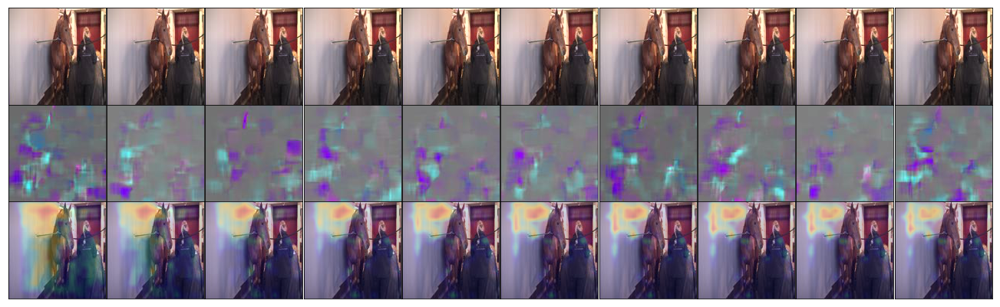

In [30]:
batch_img, batch_flow, batch_label = utils.data_for_one_random_sequence_two_stream(args, subject_dfs, computer='local', subject=2)
run_on_one_sequence(sess, clstm_model, batch_img, batch_flow, two_stream=True);

Chose subject  2
Start index in subject dataframe:  415
                                                  Path  Pain
0  data/jpg_128_128_2fps/horse_3/3_1a/frame_000416.jpg     0
1  data/jpg_128_128_2fps/horse_3/3_1a/frame_000417.jpg     0
2  data/jpg_128_128_2fps/horse_3/3_1a/frame_000418.jpg     0
3  data/jpg_128_128_2fps/horse_3/3_1a/frame_000419.jpg     0
4  data/jpg_128_128_2fps/horse_3/3_1a/frame_000420.jpg     0
5  data/jpg_128_128_2fps/horse_3/3_1a/frame_000421.jpg     0
6  data/jpg_128_128_2fps/horse_3/3_1a/frame_000422.jpg     0
7  data/jpg_128_128_2fps/horse_3/3_1a/frame_000423.jpg     0
8  data/jpg_128_128_2fps/horse_3/3_1a/frame_000424.jpg     0
9  data/jpg_128_128_2fps/horse_3/3_1a/frame_000425.jpg     0
[[[0.6382495  0.5105487 ]
  [0.6217348  0.6394412 ]
  [0.41539186 0.7239157 ]
  [0.22188234 0.6416146 ]
  [0.11310055 0.4662896 ]
  [0.06486366 0.29094517]
  [0.05991489 0.24589437]
  [0.07431716 0.32593095]
  [0.10422809 0.5051264 ]
  [0.20705524 0.62271535]]]


/Users/sbroome/miniconda2/envs/py365/lib/python3.6/site-packages/skimage/transform/_warps.py:105: UserWarning: The default mode, 'constant', will be changed to 'reflect' in skimage 0.15.
  warn("The default mode, 'constant', will be changed to 'reflect' in "
/Users/sbroome/miniconda2/envs/py365/lib/python3.6/site-packages/skimage/transform/_warps.py:110: UserWarning: Anti-aliasing will be enabled by default in skimage 0.15 to avoid aliasing artifacts when down-sampling images.
  warn("Anti-aliasing will be enabled by default in skimage 0.15 to "
/Users/sbroome/miniconda2/envs/py365/lib/python3.6/site-packages/matplotlib/cbook/deprecation.py:107: MatplotlibDeprecationWarning: Passing one of 'on', 'true', 'off', 'false' as a boolean is deprecated; use an actual boolean (True/False) instead.
  warnings.warn(message, mplDeprecation, stacklevel=1)


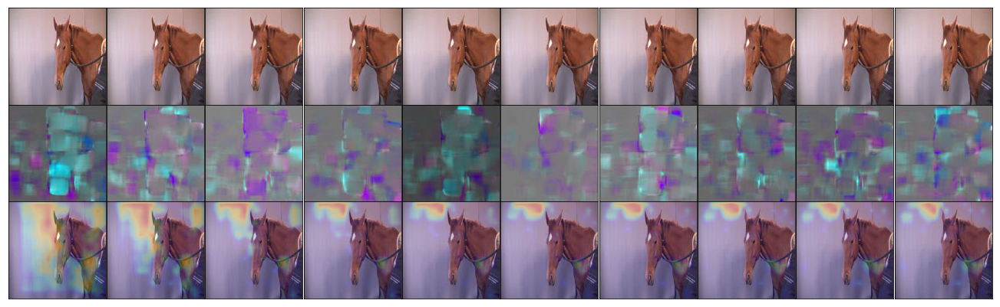

In [31]:
batch_img, batch_flow, batch_label = utils.data_for_one_random_sequence_two_stream(args, subject_dfs, computer='local', subject=2)
run_on_one_sequence(sess, clstm_model, batch_img, batch_flow, two_stream=True);

Chose subject  2
Start index in subject dataframe:  8468
                                                  Path  Pain
0  data/jpg_128_128_2fps/horse_3/3_3a/frame_001129.jpg     1
1  data/jpg_128_128_2fps/horse_3/3_3a/frame_001130.jpg     1
2  data/jpg_128_128_2fps/horse_3/3_3a/frame_001131.jpg     1
3  data/jpg_128_128_2fps/horse_3/3_3a/frame_001132.jpg     1
4  data/jpg_128_128_2fps/horse_3/3_3a/frame_001133.jpg     1
5  data/jpg_128_128_2fps/horse_3/3_3a/frame_001134.jpg     1
6  data/jpg_128_128_2fps/horse_3/3_3a/frame_001135.jpg     1
7  data/jpg_128_128_2fps/horse_3/3_3a/frame_001136.jpg     1
8  data/jpg_128_128_2fps/horse_3/3_3a/frame_001137.jpg     1
9  data/jpg_128_128_2fps/horse_3/3_3a/frame_001138.jpg     1
[[[0.64745796 0.46664914]
  [0.42861432 0.6470674 ]
  [0.10237867 0.8180475 ]
  [0.0340015  0.9441918 ]
  [0.01854805 0.973768  ]
  [0.01464134 0.9735414 ]
  [0.01373884 0.9616279 ]
  [0.01627238 0.9789604 ]
  [0.01370675 0.96871996]
  [0.02074    0.9500342 ]]]


/Users/sbroome/miniconda2/envs/py365/lib/python3.6/site-packages/skimage/transform/_warps.py:105: UserWarning: The default mode, 'constant', will be changed to 'reflect' in skimage 0.15.
  warn("The default mode, 'constant', will be changed to 'reflect' in "
/Users/sbroome/miniconda2/envs/py365/lib/python3.6/site-packages/skimage/transform/_warps.py:110: UserWarning: Anti-aliasing will be enabled by default in skimage 0.15 to avoid aliasing artifacts when down-sampling images.
  warn("Anti-aliasing will be enabled by default in skimage 0.15 to "
/Users/sbroome/miniconda2/envs/py365/lib/python3.6/site-packages/matplotlib/cbook/deprecation.py:107: MatplotlibDeprecationWarning: Passing one of 'on', 'true', 'off', 'false' as a boolean is deprecated; use an actual boolean (True/False) instead.
  warnings.warn(message, mplDeprecation, stacklevel=1)


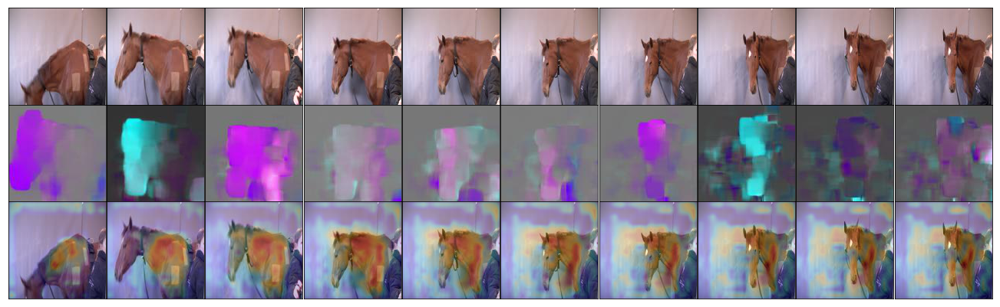

In [32]:
batch_img, batch_flow, batch_label = utils.data_for_one_random_sequence_two_stream(args, subject_dfs, computer='local', subject=2)
run_on_one_sequence(sess, clstm_model, batch_img, batch_flow, two_stream=True);

Chose subject  2
Start index in subject dataframe:  4304
                                                  Path  Pain
0  data/jpg_128_128_2fps/horse_3/3_1c/frame_000663.jpg     0
1  data/jpg_128_128_2fps/horse_3/3_1c/frame_000664.jpg     0
2  data/jpg_128_128_2fps/horse_3/3_1c/frame_000665.jpg     0
3  data/jpg_128_128_2fps/horse_3/3_1c/frame_000666.jpg     0
4  data/jpg_128_128_2fps/horse_3/3_1c/frame_000667.jpg     0
5  data/jpg_128_128_2fps/horse_3/3_1c/frame_000668.jpg     0
6  data/jpg_128_128_2fps/horse_3/3_1c/frame_000669.jpg     0
7  data/jpg_128_128_2fps/horse_3/3_1c/frame_000670.jpg     0
8  data/jpg_128_128_2fps/horse_3/3_1c/frame_000671.jpg     0
9  data/jpg_128_128_2fps/horse_3/3_1c/frame_000672.jpg     0
[[[0.65182495 0.3532578 ]
  [0.6455949  0.2953222 ]
  [0.5076071  0.27114043]
  [0.5407205  0.20529981]
  [0.75921345 0.16311426]
  [0.8968349  0.09169474]
  [0.9568288  0.07969384]
  [0.9745737  0.08546341]
  [0.9728794  0.08273736]
  [0.9725294  0.09818179]]]


/Users/sbroome/miniconda2/envs/py365/lib/python3.6/site-packages/skimage/transform/_warps.py:105: UserWarning: The default mode, 'constant', will be changed to 'reflect' in skimage 0.15.
  warn("The default mode, 'constant', will be changed to 'reflect' in "
/Users/sbroome/miniconda2/envs/py365/lib/python3.6/site-packages/skimage/transform/_warps.py:110: UserWarning: Anti-aliasing will be enabled by default in skimage 0.15 to avoid aliasing artifacts when down-sampling images.
  warn("Anti-aliasing will be enabled by default in skimage 0.15 to "
/Users/sbroome/miniconda2/envs/py365/lib/python3.6/site-packages/matplotlib/cbook/deprecation.py:107: MatplotlibDeprecationWarning: Passing one of 'on', 'true', 'off', 'false' as a boolean is deprecated; use an actual boolean (True/False) instead.
  warnings.warn(message, mplDeprecation, stacklevel=1)


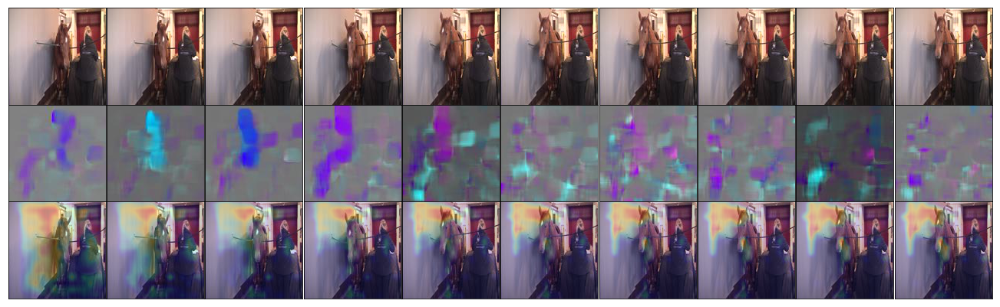

In [33]:
batch_img, batch_flow, batch_label = utils.data_for_one_random_sequence_two_stream(args, subject_dfs, computer='local', subject=2)
run_on_one_sequence(sess, clstm_model, batch_img, batch_flow, two_stream=True);

Chose subject  2
Start index in subject dataframe:  2710
                                                  Path  Pain
0  data/jpg_128_128_2fps/horse_3/3_1b/frame_000693.jpg     0
1  data/jpg_128_128_2fps/horse_3/3_1b/frame_000694.jpg     0
2  data/jpg_128_128_2fps/horse_3/3_1b/frame_000695.jpg     0
3  data/jpg_128_128_2fps/horse_3/3_1b/frame_000696.jpg     0
4  data/jpg_128_128_2fps/horse_3/3_1b/frame_000697.jpg     0
5  data/jpg_128_128_2fps/horse_3/3_1b/frame_000698.jpg     0
6  data/jpg_128_128_2fps/horse_3/3_1b/frame_000699.jpg     0
7  data/jpg_128_128_2fps/horse_3/3_1b/frame_000700.jpg     0
8  data/jpg_128_128_2fps/horse_3/3_1b/frame_000701.jpg     0
9  data/jpg_128_128_2fps/horse_3/3_1b/frame_000702.jpg     0
[[[0.63342535 0.4371368 ]
  [0.6864153  0.4172695 ]
  [0.6895206  0.41287273]
  [0.5579116  0.44192764]
  [0.48344332 0.40114814]
  [0.6010958  0.5427147 ]
  [0.5868447  0.7106718 ]
  [0.5920654  0.80778396]
  [0.60340935 0.8591264 ]
  [0.6680358  0.8841921 ]]]


/Users/sbroome/miniconda2/envs/py365/lib/python3.6/site-packages/skimage/transform/_warps.py:105: UserWarning: The default mode, 'constant', will be changed to 'reflect' in skimage 0.15.
  warn("The default mode, 'constant', will be changed to 'reflect' in "
/Users/sbroome/miniconda2/envs/py365/lib/python3.6/site-packages/skimage/transform/_warps.py:110: UserWarning: Anti-aliasing will be enabled by default in skimage 0.15 to avoid aliasing artifacts when down-sampling images.
  warn("Anti-aliasing will be enabled by default in skimage 0.15 to "
/Users/sbroome/miniconda2/envs/py365/lib/python3.6/site-packages/matplotlib/cbook/deprecation.py:107: MatplotlibDeprecationWarning: Passing one of 'on', 'true', 'off', 'false' as a boolean is deprecated; use an actual boolean (True/False) instead.
  warnings.warn(message, mplDeprecation, stacklevel=1)


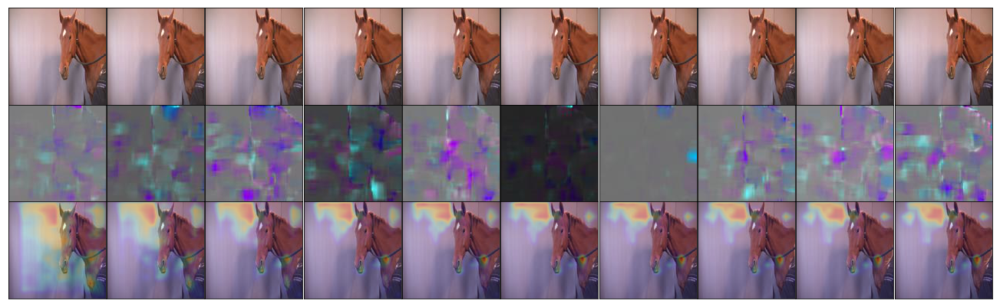

In [34]:
batch_img, batch_flow, batch_label = utils.data_for_one_random_sequence_two_stream(args, subject_dfs, computer='local', subject=2)
run_on_one_sequence(sess, clstm_model, batch_img, batch_flow, two_stream=True);

Chose subject  2
Start index in subject dataframe:  8773
                                                  Path  Pain
0  data/jpg_128_128_2fps/horse_3/3_3a/frame_001434.jpg     1
1  data/jpg_128_128_2fps/horse_3/3_3a/frame_001435.jpg     1
2  data/jpg_128_128_2fps/horse_3/3_3a/frame_001436.jpg     1
3  data/jpg_128_128_2fps/horse_3/3_3a/frame_001437.jpg     1
4  data/jpg_128_128_2fps/horse_3/3_3a/frame_001438.jpg     1
5  data/jpg_128_128_2fps/horse_3/3_3a/frame_001439.jpg     1
6  data/jpg_128_128_2fps/horse_3/3_3a/frame_001440.jpg     1
7  data/jpg_128_128_2fps/horse_3/3_3a/frame_001441.jpg     1
8  data/jpg_128_128_2fps/horse_3/3_3a/frame_001442.jpg     1
9  data/jpg_128_128_2fps/horse_3/3_3a/frame_001443.jpg     1
[[[0.5653042  0.43554157]
  [0.44973055 0.50238305]
  [0.22358036 0.6854522 ]
  [0.05479824 0.7496171 ]
  [0.02226098 0.6917922 ]
  [0.02713672 0.72917885]
  [0.05125085 0.84820276]
  [0.08799    0.82682335]
  [0.10304988 0.864589  ]
  [0.14370775 0.8941323 ]]]


/Users/sbroome/miniconda2/envs/py365/lib/python3.6/site-packages/skimage/transform/_warps.py:105: UserWarning: The default mode, 'constant', will be changed to 'reflect' in skimage 0.15.
  warn("The default mode, 'constant', will be changed to 'reflect' in "
/Users/sbroome/miniconda2/envs/py365/lib/python3.6/site-packages/skimage/transform/_warps.py:110: UserWarning: Anti-aliasing will be enabled by default in skimage 0.15 to avoid aliasing artifacts when down-sampling images.
  warn("Anti-aliasing will be enabled by default in skimage 0.15 to "
/Users/sbroome/miniconda2/envs/py365/lib/python3.6/site-packages/matplotlib/cbook/deprecation.py:107: MatplotlibDeprecationWarning: Passing one of 'on', 'true', 'off', 'false' as a boolean is deprecated; use an actual boolean (True/False) instead.
  warnings.warn(message, mplDeprecation, stacklevel=1)


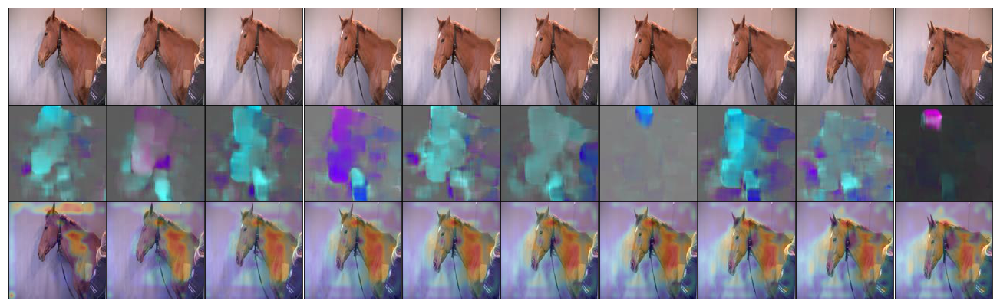

In [36]:
batch_img, batch_flow, batch_label = utils.data_for_one_random_sequence_two_stream(args, subject_dfs, computer='local', subject=2)
run_on_one_sequence(sess, clstm_model, batch_img, batch_flow, two_stream=True);

Chose subject  2
Start index in subject dataframe:  10648
                                                  Path  Pain
0  data/jpg_128_128_2fps/horse_3/3_5b/frame_000085.jpg     1
1  data/jpg_128_128_2fps/horse_3/3_5b/frame_000086.jpg     1
2  data/jpg_128_128_2fps/horse_3/3_5b/frame_000087.jpg     1
3  data/jpg_128_128_2fps/horse_3/3_5b/frame_000088.jpg     1
4  data/jpg_128_128_2fps/horse_3/3_5b/frame_000089.jpg     1
5  data/jpg_128_128_2fps/horse_3/3_5b/frame_000090.jpg     1
6  data/jpg_128_128_2fps/horse_3/3_5b/frame_000091.jpg     1
7  data/jpg_128_128_2fps/horse_3/3_5b/frame_000092.jpg     1
8  data/jpg_128_128_2fps/horse_3/3_5b/frame_000093.jpg     1
9  data/jpg_128_128_2fps/horse_3/3_5b/frame_000094.jpg     1
[[[6.1181170e-01 3.9302760e-01]
  [5.2313018e-01 5.1283932e-01]
  [2.0297080e-01 7.3125631e-01]
  [5.0364397e-02 8.8336825e-01]
  [1.7511001e-02 9.4029301e-01]
  [6.4264704e-03 9.6575838e-01]
  [3.0646070e-03 9.7246969e-01]
  [1.2186401e-03 9.8197430e-01]
  [4.2483519e-0

/Users/sbroome/miniconda2/envs/py365/lib/python3.6/site-packages/skimage/transform/_warps.py:105: UserWarning: The default mode, 'constant', will be changed to 'reflect' in skimage 0.15.
  warn("The default mode, 'constant', will be changed to 'reflect' in "
/Users/sbroome/miniconda2/envs/py365/lib/python3.6/site-packages/skimage/transform/_warps.py:110: UserWarning: Anti-aliasing will be enabled by default in skimage 0.15 to avoid aliasing artifacts when down-sampling images.
  warn("Anti-aliasing will be enabled by default in skimage 0.15 to "
/Users/sbroome/miniconda2/envs/py365/lib/python3.6/site-packages/matplotlib/cbook/deprecation.py:107: MatplotlibDeprecationWarning: Passing one of 'on', 'true', 'off', 'false' as a boolean is deprecated; use an actual boolean (True/False) instead.
  warnings.warn(message, mplDeprecation, stacklevel=1)


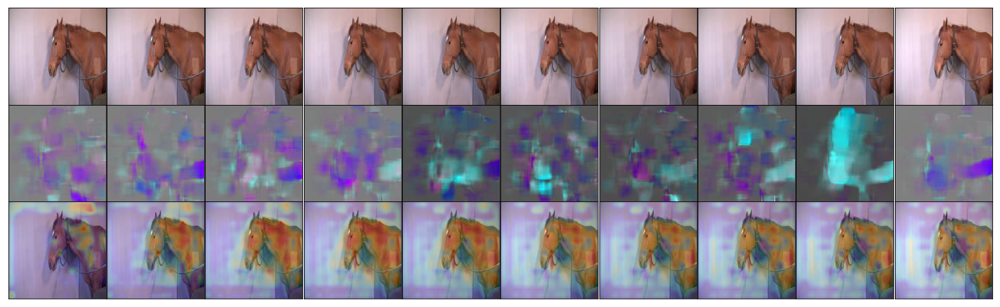

In [40]:
batch_img, batch_flow, batch_label = utils.data_for_one_random_sequence_two_stream(args, subject_dfs, computer='local', subject=2)
run_on_one_sequence(sess, clstm_model, batch_img, batch_flow, two_stream=True);

Chose subject  2
Start index in subject dataframe:  9038
                                                  Path  Pain
0  data/jpg_128_128_2fps/horse_3/3_3b/frame_000255.jpg     1
1  data/jpg_128_128_2fps/horse_3/3_3b/frame_000256.jpg     1
2  data/jpg_128_128_2fps/horse_3/3_3b/frame_000257.jpg     1
3  data/jpg_128_128_2fps/horse_3/3_3b/frame_000258.jpg     1
4  data/jpg_128_128_2fps/horse_3/3_3b/frame_000259.jpg     1
5  data/jpg_128_128_2fps/horse_3/3_3b/frame_000260.jpg     1
6  data/jpg_128_128_2fps/horse_3/3_3b/frame_000261.jpg     1
7  data/jpg_128_128_2fps/horse_3/3_3b/frame_000262.jpg     1
8  data/jpg_128_128_2fps/horse_3/3_3b/frame_000263.jpg     1
9  data/jpg_128_128_2fps/horse_3/3_3b/frame_000264.jpg     1
[[[0.73875076 0.42974356]
  [0.83510613 0.38875413]
  [0.75964195 0.37301123]
  [0.70234746 0.42603034]
  [0.68636566 0.44113067]
  [0.692576   0.48184183]
  [0.6584107  0.51500106]
  [0.50455105 0.58346534]
  [0.42580667 0.7240887 ]
  [0.42744803 0.8114344 ]]]


/Users/sbroome/miniconda2/envs/py365/lib/python3.6/site-packages/skimage/transform/_warps.py:105: UserWarning: The default mode, 'constant', will be changed to 'reflect' in skimage 0.15.
  warn("The default mode, 'constant', will be changed to 'reflect' in "
/Users/sbroome/miniconda2/envs/py365/lib/python3.6/site-packages/skimage/transform/_warps.py:110: UserWarning: Anti-aliasing will be enabled by default in skimage 0.15 to avoid aliasing artifacts when down-sampling images.
  warn("Anti-aliasing will be enabled by default in skimage 0.15 to "
/Users/sbroome/miniconda2/envs/py365/lib/python3.6/site-packages/matplotlib/cbook/deprecation.py:107: MatplotlibDeprecationWarning: Passing one of 'on', 'true', 'off', 'false' as a boolean is deprecated; use an actual boolean (True/False) instead.
  warnings.warn(message, mplDeprecation, stacklevel=1)


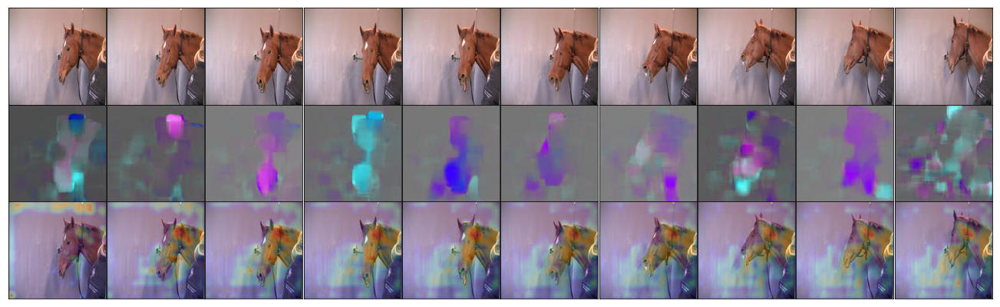

In [41]:
batch_img, batch_flow, batch_label = utils.data_for_one_random_sequence_two_stream(args, subject_dfs, computer='local', subject=2, start_index=9038)
run_on_one_sequence(sess, clstm_model, batch_img, batch_flow, two_stream=True);